In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math

In [36]:
base = "/data/nsense-ptas/deepface/detection/mask_classification/save_results/"
testlist=['test','test_mfr2']
model_list={
    'mbn-small-1':'mobilenetv3-small_facemask_filtering-id_230314_lr00005_aug_focal',
    'mbn-small-2':'mobilenetv3-small2_facemask_filtering-id_230314_lr00005_aug_focal',
    'mbn-small-3':'mobilenetv3-small2_facemask_filtering-idb_230314_lr00005_aug',
    'mbn-small-4':'mobilenetv3-small_facemask_filtering-id_230314_lr00005_aug',
    'mbf-small-5':'mobilenetv3-small_facemask_filtering-idb_230314_lr00005_aug',
#     'mbf-small-6':'mobilenetv3-small_facemask_filtering-id_230314_lr0001_aug',
#     'mbf-small-7':'mobilenetv3-small_facemask_filtering-idb_230314_lr00005_aug_b256',
    'mbn-large-1':'mobilenetv3-large2_facemask_filtering-id_230314_lr0001_aug_focal',
    'mbn-large-2':'mobilenetv3-large2_facemask_filtering-idb_230314_lr0001_aug',
    'mbn-large-3':'mobilenetv3-large_facemask_filtering-id_230314_lr0001_aug_focal', 
    'mbn-large-4':'mobilenetv3-large_facemask_filtering-idb_230314_lr0001_aug', 
    'mbn-large-5':'mobilenetv3-large_facemask_filtering-id_230314_lr00005_aug_focal',
    'mbf-1':'mobilefacenet_facemask_filtering-id_230314_lr00001_aug_focal',
    'mbf-2':'mobilefacenet_facemask_filtering-idb_230314_lr00001_aug', 
}

In [37]:
save_base = "./save_results_image/"
if not os.path.exists(save_base):
    os.mkdir(save_base)

mbn-small-1
mbn-small-2
mbn-small-3
mbn-small-4
mbf-small-5
mbn-large-1


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


mbn-large-2
mbn-large-3
mbn-large-4
mbn-large-5
mbf-1
mbf-2


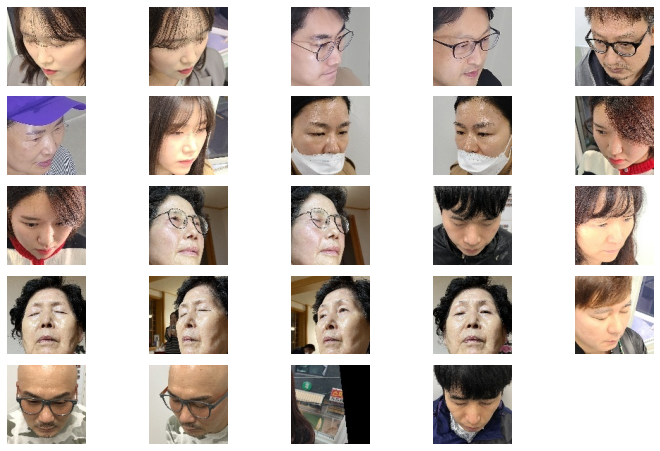

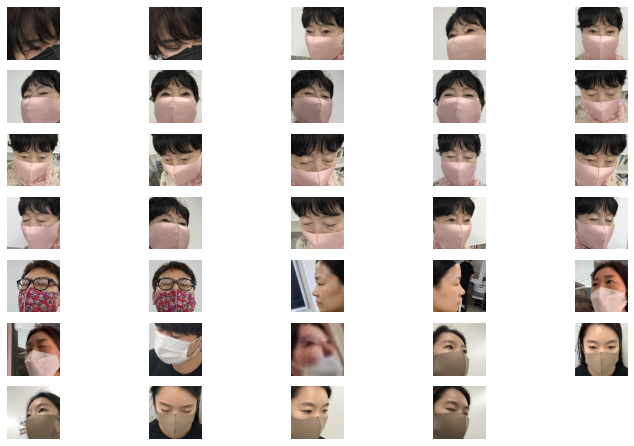

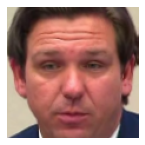

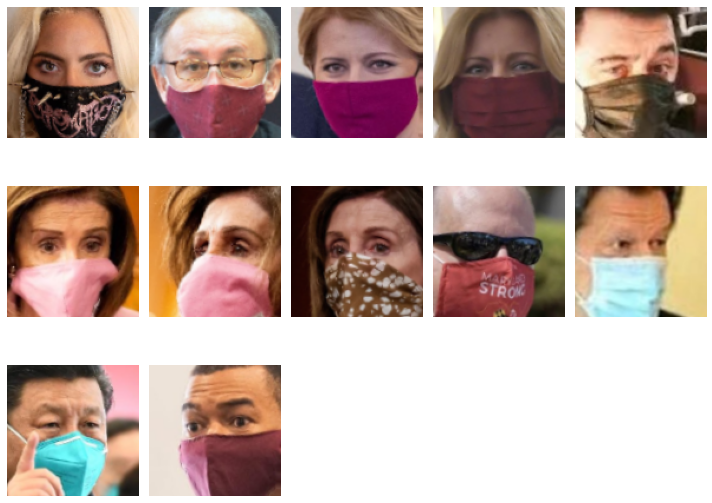

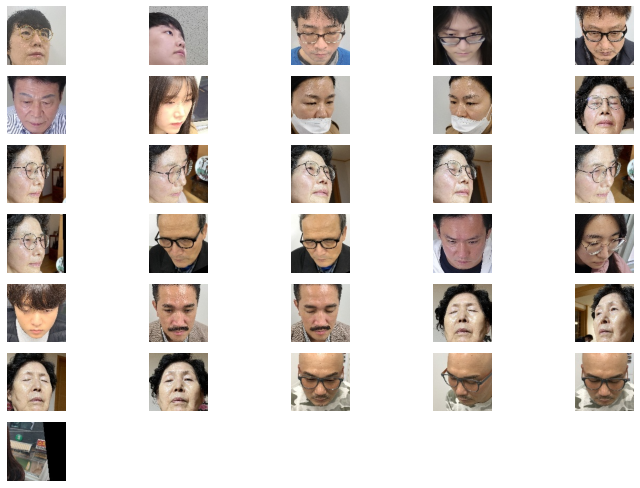

...

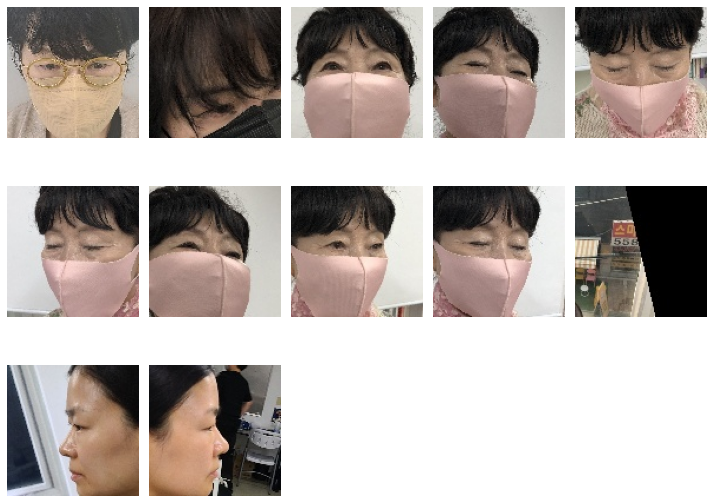

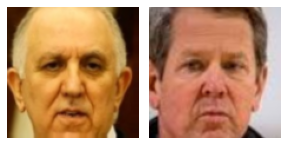

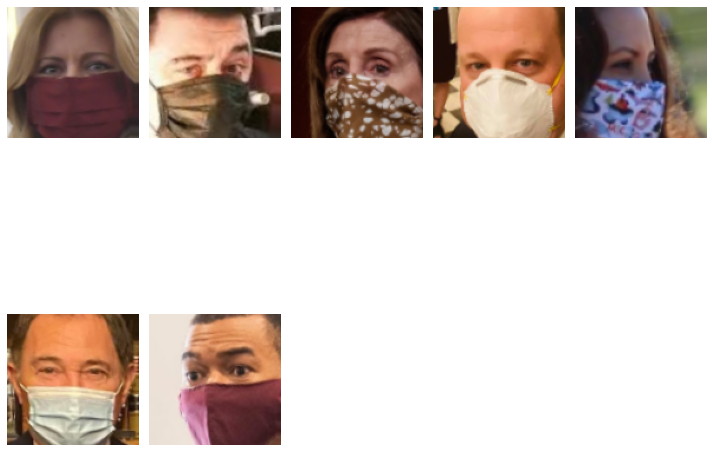

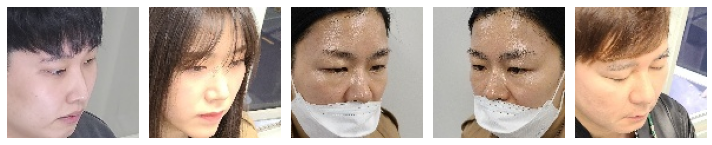

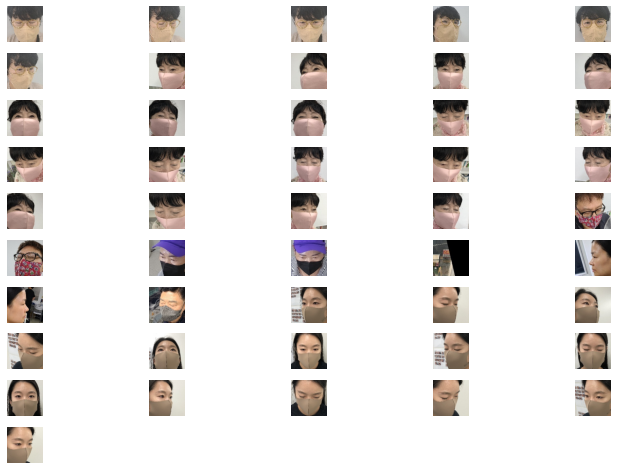

<Figure size 720x2160 with 0 Axes>

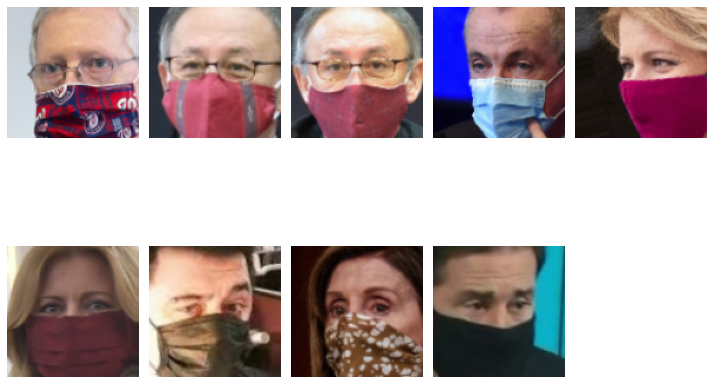

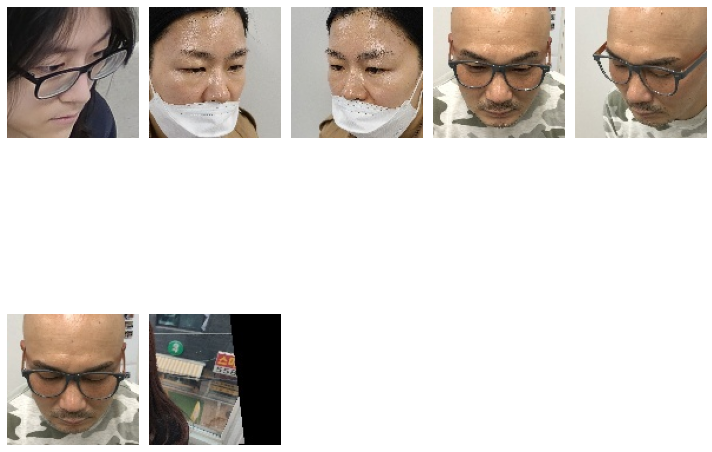

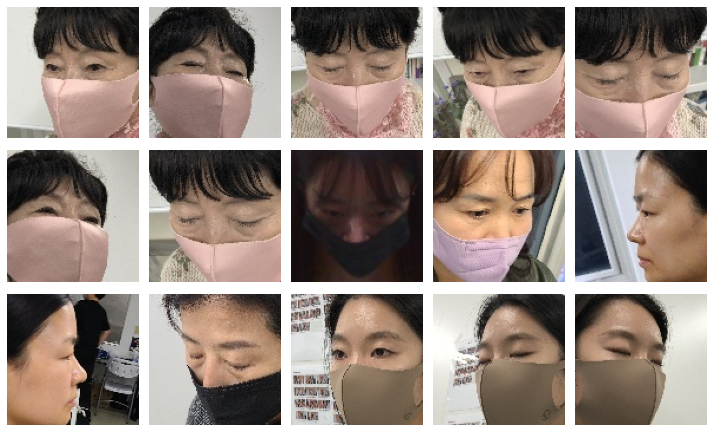

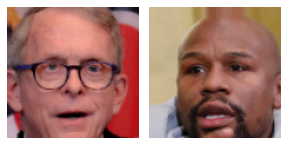

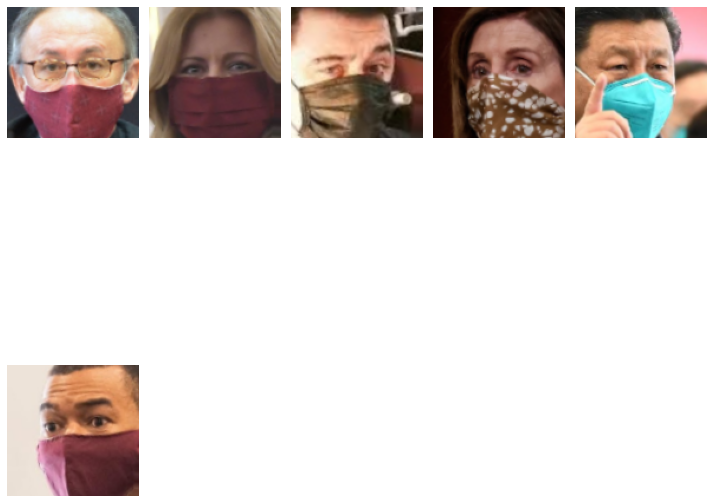

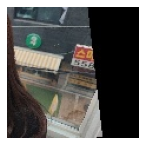

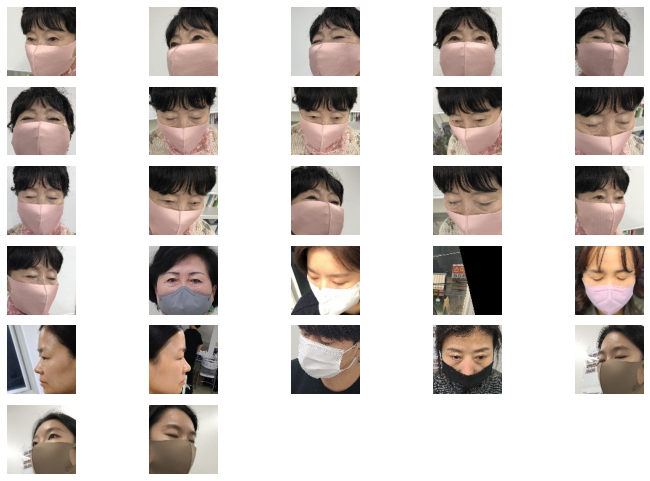

<Figure size 720x2160 with 0 Axes>

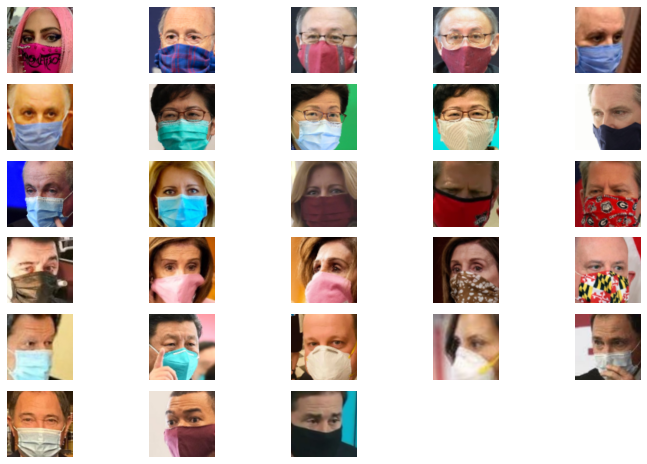

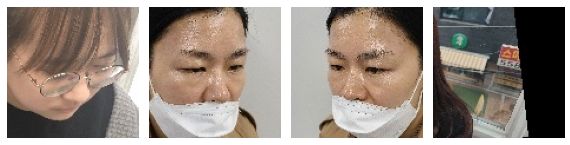

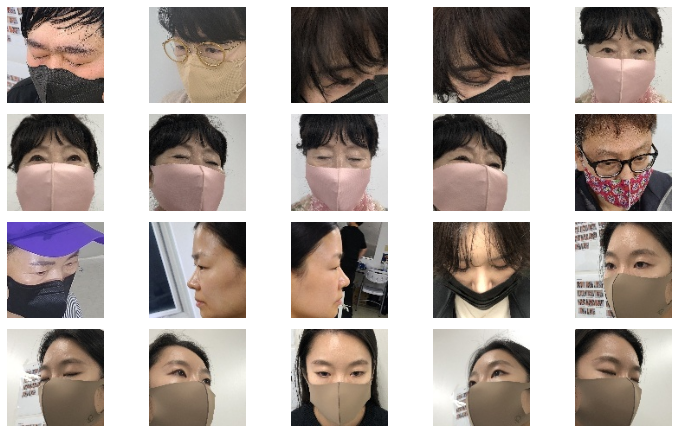

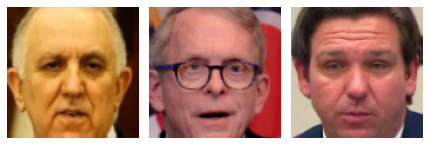

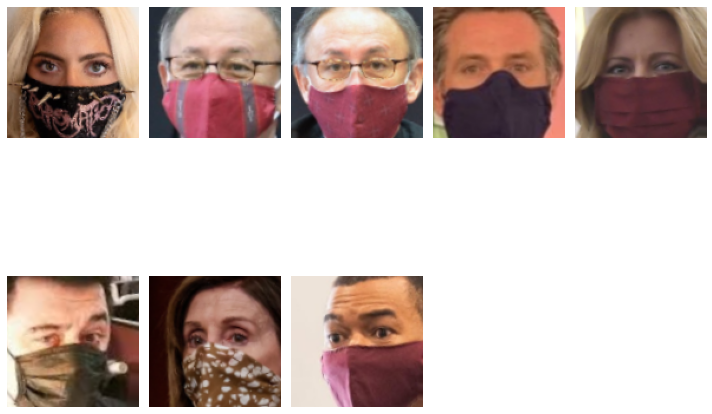

...

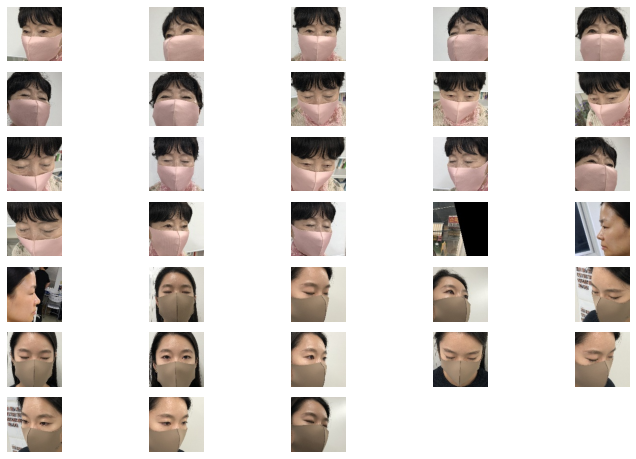

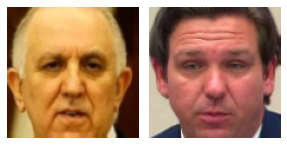

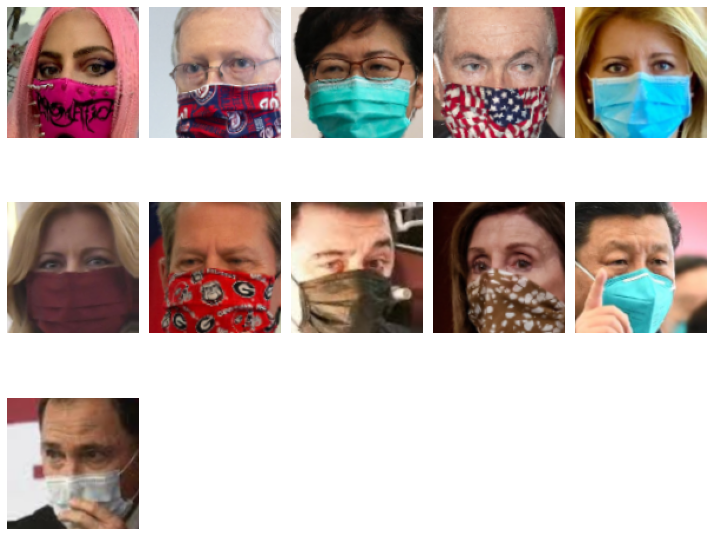

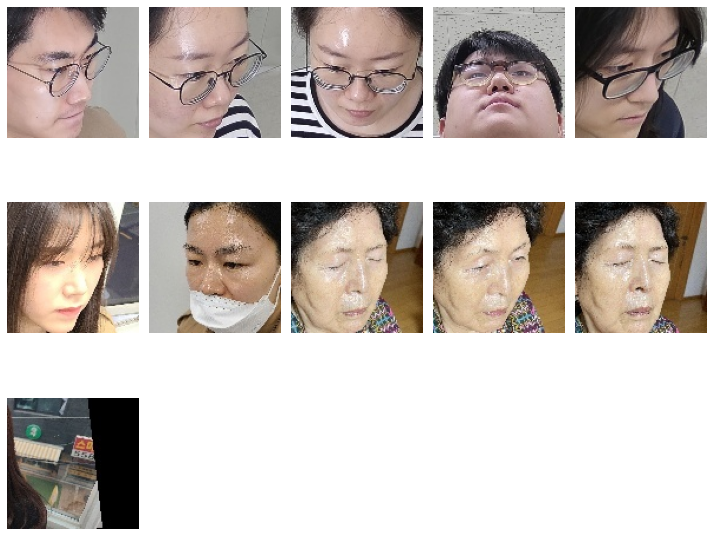

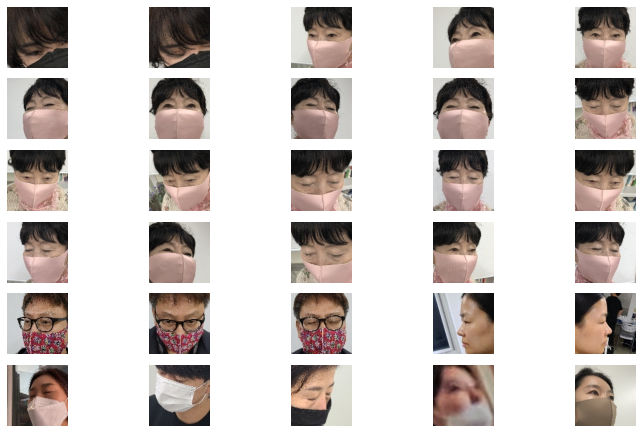

<Figure size 720x2160 with 0 Axes>

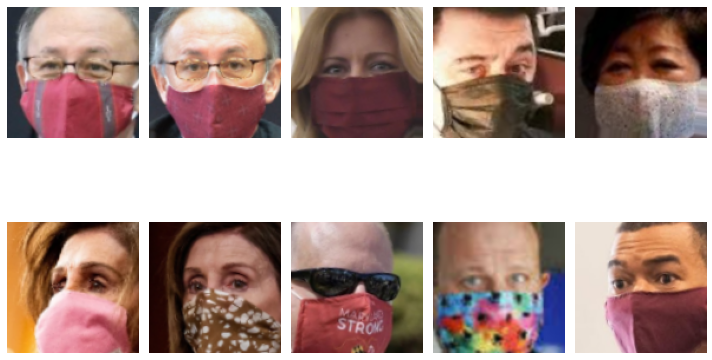

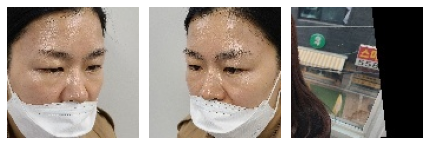

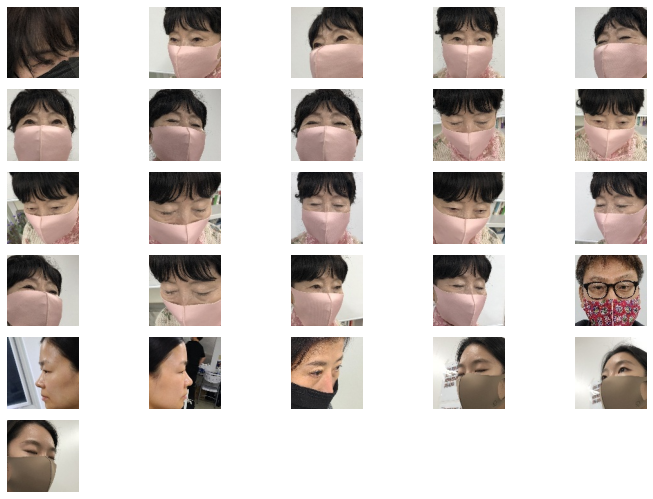

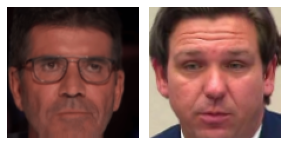

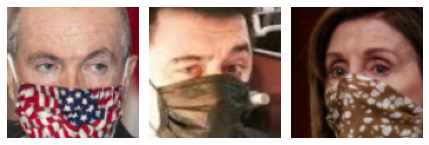

In [38]:
for mk in model_list:
    mname = model_list[mk]
    print(mk)
    for tname in testlist:
        txt_path = base+mname+"_"+tname+".txt"
        lines = open(txt_path,'r').readlines()
        
        false_list={'unmask':[],'mask':[]}
        for line in lines:
            sp = line.strip().split(",")
            img_path,gt_str,gt_lb,pred_str,pred_lb = sp

            if not gt_str==pred_str:
                false_list[gt_str].append(img_path)
                
        plt.figure(figsize=(10,30))

        for i,path in enumerate(false_list['unmask']):
            img = cv2.cvtColor(cv2.imread(path),cv2.COLOR_BGR2RGB)
            plt.subplot(math.ceil(len(false_list['unmask'])),5,i+1)
            plt.axis('off')
            plt.tight_layout()
            plt.imshow(img)
        save_path = os.path.join(save_base,"{}_{}_unmaskFalse.jpg".format(mk,tname))
        plt.savefig(save_path, bbox_inches='tight')
        
        plt.figure(figsize=(10,30))
        for i,path in enumerate(false_list['mask']):
            img = cv2.cvtColor(cv2.imread(path),cv2.COLOR_BGR2RGB)
            plt.subplot(math.ceil(len(false_list['mask'])),5,i+1)
            plt.axis('off')
            plt.tight_layout()
            plt.imshow(img)
        save_path = os.path.join(save_base,"{}_{}_maskFalse.jpg".format(mk,tname))
        plt.savefig(save_path, bbox_inches='tight')


In [10]:
false_list={'unmask':[],'mask':[]}
for line in lines:
    sp = line.strip().split(",")
    img_path,gt_str,gt_lb,pred_str,pred_lb = sp
    
    if not gt_str==pred_str:
        false_list[gt_str].append(img_path)

In [11]:
print(len(false_list['unmask']),len(false_list['mask']))

24 34


mobilenetv3-small_facemask_filtering-id_230314_lr00005_aug_focal_test_unmaskFalse.jpg


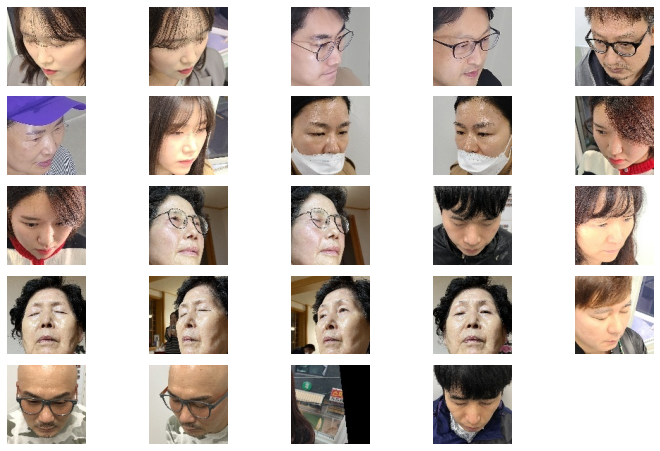

In [18]:
plt.figure(figsize=(10,30))

for i,path in enumerate(false_list['unmask']):
    img = cv2.cvtColor(cv2.imread(path),cv2.COLOR_BGR2RGB)
    plt.subplot(math.ceil(len(false_list['unmask'])),5,i+1)
    plt.axis('off')
    plt.tight_layout()
    plt.imshow(img)
    plt.savefig('test.png', bbox_inches='tight')
print("{}_{}_unmaskFalse.jpg".format(mname,tname))

mobilenetv3-small_facemask_filtering_230307_lr00005_aug_test_mfr2_maskFalse.jpg


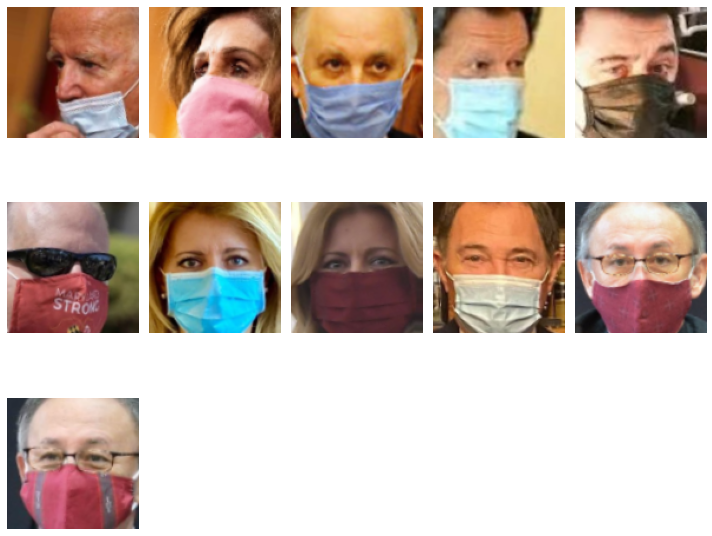

In [77]:
plt.figure(figsize=(10,30))

for i,path in enumerate(false_list['mask']):
    img = cv2.cvtColor(cv2.imread(path),cv2.COLOR_BGR2RGB)
    plt.subplot(math.ceil(len(false_list['mask'])),5,i+1)
    plt.axis('off')
    plt.tight_layout()
    plt.imshow(img)
print("{}_{}_maskFalse.jpg".format(mname,tname))